<a href="https://colab.research.google.com/github/bkkaggle/pytorch-CycleGAN-and-pix2pix/blob/master/pix2pix.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Install

In [ ]:
!git clone https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix

In [ ]:
import os
os.chdir('/home/ubuntu/hcdai/Projects/pytorch-CycleGAN-and-pix2pix/')

In [ ]:
!pip install -r requirements.txt

# Datasets

Download one of the official datasets with:

-   `bash ./datasets/download_pix2pix_dataset.sh [cityscapes, night2day, edges2handbags, edges2shoes, facades, maps]`

Or use your own dataset by creating the appropriate folders and adding in the images. Follow the instructions [here](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/docs/datasets.md#pix2pix-datasets).

In [2]:
!bash ./datasets/download_pix2pix_dataset.sh edges2shoes

Specified [edges2shoes]
for details.

--2023-05-25 01:22:09--  http://efrosgans.eecs.berkeley.edu/pix2pix/datasets/edges2shoes.tar.gz
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2165283376 (2.0G) [application/x-gzip]
Saving to: ‘./datasets/edges2shoes.tar.gz’

./datasets/edges2sh 100%[===================>]   2.02G  3.32MB/s    in 11m 14s 

2023-05-25 01:33:23 (3.07 MB/s) - ‘./datasets/edges2shoes.tar.gz’ saved [2165283376/2165283376]

edges2shoes/
edges2shoes/train/
edges2shoes/train/10000_AB.jpg
edges2shoes/train/10001_AB.jpg
edges2shoes/train/10002_AB.jpg
edges2shoes/train/10003_AB.jpg
edges2shoes/train/10004_AB.jpg
edges2shoes/train/10005_AB.jpg
edges2shoes/train/10006_AB.jpg
edges2shoes/train/10007_AB.jpg
edges2shoes/train/10008_AB.jpg
edges2shoes/train/10009_AB.jpg
edges2shoes/train

# Pretrained models

Download one of the official pretrained models with:

-   `bash ./scripts/download_pix2pix_model.sh [edges2shoes, sat2map, map2sat, facades_label2photo, and day2night]`

Or add your own pretrained model to `./checkpoints/{NAME}_pretrained/latest_net_G.pt`

In [1]:
!bash /home/ubuntu/hcdai/Projects/pytorch-CycleGAN-and-pix2pix/scripts/download_pix2pix_model.sh edges2shoes

Note: available models are edges2shoes, sat2map, map2sat, facades_label2photo, and day2night
Specified [edges2shoes]
for details.

--2023-05-25 01:05:31--  http://efrosgans.eecs.berkeley.edu/pix2pix/models-pytorch/edges2shoes.pth
Resolving efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)... 128.32.244.190
Connecting to efrosgans.eecs.berkeley.edu (efrosgans.eecs.berkeley.edu)|128.32.244.190|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 217704688 (208M)
Saving to: ‘./checkpoints/edges2shoes_pretrained/latest_net_G.pth’

./checkpoints/edges 100%[===================>] 207.62M  70.9MB/s    in 2.9s    

2023-05-25 01:05:34 (70.9 MB/s) - ‘./checkpoints/edges2shoes_pretrained/latest_net_G.pth’ saved [217704688/217704688]



# Training

-   `python train.py --dataroot ./datasets/facades --name facades_pix2pix --model pix2pix --direction BtoA`

Change the `--dataroot` and `--name` to your own dataset's path and model's name. Use `--gpu_ids 0,1,..` to train on multiple GPUs and `--batch_size` to change the batch size. Add `--direction BtoA` if you want to train a model to transfrom from class B to A.

In [3]:
!python train.py --dataroot ./datasets/edges2shoes --name edges2shoes_pix2pix --model pix2pix --direction AtoB --display_id -1

----------------- Options ---------------
               batch_size: 300                           
                    beta1: 0.5                           
          checkpoints_dir: ./checkpoints                 
           continue_train: False                         
                crop_size: 256                           
                 dataroot: ./datasets/edges2shoes        	[default: None]
             dataset_mode: aligned                       
                direction: AtoB                          
              display_env: main                          
             display_freq: 400                           
               display_id: -1                            	[default: 1]
            display_ncols: 4                             
             display_port: 8097                          
           display_server: http://localhost              
          display_winsize: 256                           
                    epoch: latest                        
 

# Testing

-   `python test.py --dataroot ./datasets/facades --direction BtoA --model pix2pix --name facades_pix2pix`

Change the `--dataroot`, `--name`, and `--direction` to be consistent with your trained model's configuration and how you want to transform images.

> from https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix:
> Note that we specified --direction BtoA as Facades dataset's A to B direction is photos to labels.

> If you would like to apply a pre-trained model to a collection of input images (rather than image pairs), please use --model test option. See ./scripts/test_single.sh for how to apply a model to Facade label maps (stored in the directory facades/testB).

> See a list of currently available models at ./scripts/download_pix2pix_model.sh

In [6]:
!python test.py --dataroot ./datasets/edges2shoes --direction AtoB --model pix2pix --name edges2shoes_pix2pix

----------------- Options ---------------
             aspect_ratio: 1.0                           
               batch_size: 200                           
          checkpoints_dir: ./checkpoints                 
                crop_size: 256                           
                 dataroot: ./datasets/edges2shoes        	[default: None]
             dataset_mode: aligned                       
                direction: AtoB                          
          display_winsize: 256                           
                    epoch: latest                        
                     eval: False                         
                  gpu_ids: 0                             
                init_gain: 0.02                          
                init_type: normal                        
                 input_nc: 3                             
                  isTrain: False                         	[default: None]
                load_iter: 0                            

# Visualize

In [ ]:
import matplotlib.pyplot as plt

img = plt.imread('./results/facades_label2photo_pretrained/test_latest/images/100_fake_B.png')
plt.imshow(img)

In [ ]:
img = plt.imread('./results/facades_label2photo_pretrained/test_latest/images/100_real_A.png')
plt.imshow(img)

In [ ]:
img = plt.imread('./results/facades_label2photo_pretrained/test_latest/images/100_real_B.png')
plt.imshow(img)

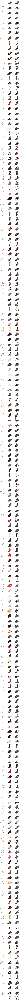

In [5]:
import os
import matplotlib.pyplot as plt
from PIL import Image

result_path = '/home/ubuntu/hcdai/Projects/pytorch-CycleGAN-and-pix2pix/results/edges2shoes_pix2pix/test_latest/images'
sample_num = len(os.listdir(result_path))//3
fig = plt.figure(figsize=(8, sample_num*2))
    
for index in range(1,sample_num):
    ax1 = fig.add_subplot(sample_num, 3, index*3 + 1)
    im1 = ax1.imshow(Image.open(f'{result_path}/{index}_AB_real_A.png'))
    if index == 0: 
        ax1.set_title(f'real A')
    plt.axis('off')

    ax2 = fig.add_subplot(sample_num, 3, index*3 + 2)
    im2 = ax2.imshow(Image.open(f'{result_path}/{index}_AB_real_B.png'))
    if index == 0: 
        ax2.set_title('real B')
    plt.axis('off')

    ax3 = fig.add_subplot(sample_num, 3, index*3 + 3)
    im3 = ax3.imshow(Image.open(f'{result_path}/{index}_AB_fake_B.png'))
    if index == 0: 
        ax3.set_title('fake B')
    plt.axis('off')